# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# TODO: Fill this in based on where you saved the training and testing data

training_file = "traffic-signs-data/train.p"
testing_file = "traffic-signs-data/test.p"

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']



---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [2]:
### Replace each question mark with the appropriate value.
import numpy as np

# TODO: Number of training examples
n_train = len(X_train)

# TODO: Number of testing examples.
n_test = len(X_test)

# TODO: What's the shape of an traffic sign image?
image_shape = X_train[0].shape

# TODO: How many unique classes/labels there are in the dataset.
n_classes = len(np.unique(y_train))



print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)
print(y_train.shape)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43
(39209,)


In [3]:
img_size = X_train[0].shape[0]
num_channels = X_train[0].shape[2]
num_classes = n_classes


In [4]:
import csv
def read_csv_and_parse():
    traffic_labels_dict ={}
    with open('signnames.csv') as f:
        reader = csv.reader(f)
        count = -1;
        for row in reader:
            count = count + 1
            if(count == 0):
                continue
            label_index = int(row[0])
            traffic_labels_dict[label_index] = row[1]
    return traffic_labels_dict
traffic_labels_dict = read_csv_and_parse()
print(traffic_labels_dict)

{0: 'Speed limit (20km/h)', 1: 'Speed limit (30km/h)', 2: 'Speed limit (50km/h)', 3: 'Speed limit (60km/h)', 4: 'Speed limit (70km/h)', 5: 'Speed limit (80km/h)', 6: 'End of speed limit (80km/h)', 7: 'Speed limit (100km/h)', 8: 'Speed limit (120km/h)', 9: 'No passing', 10: 'No passing for vehicles over 3.5 metric tons', 11: 'Right-of-way at the next intersection', 12: 'Priority road', 13: 'Yield', 14: 'Stop', 15: 'No vehicles', 16: 'Vehicles over 3.5 metric tons prohibited', 17: 'No entry', 18: 'General caution', 19: 'Dangerous curve to the left', 20: 'Dangerous curve to the right', 21: 'Double curve', 22: 'Bumpy road', 23: 'Slippery road', 24: 'Road narrows on the right', 25: 'Road work', 26: 'Traffic signals', 27: 'Pedestrians', 28: 'Children crossing', 29: 'Bicycles crossing', 30: 'Beware of ice/snow', 31: 'Wild animals crossing', 32: 'End of all speed and passing limits', 33: 'Turn right ahead', 34: 'Turn left ahead', 35: 'Ahead only', 36: 'Go straight or right', 37: 'Go straight o

Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

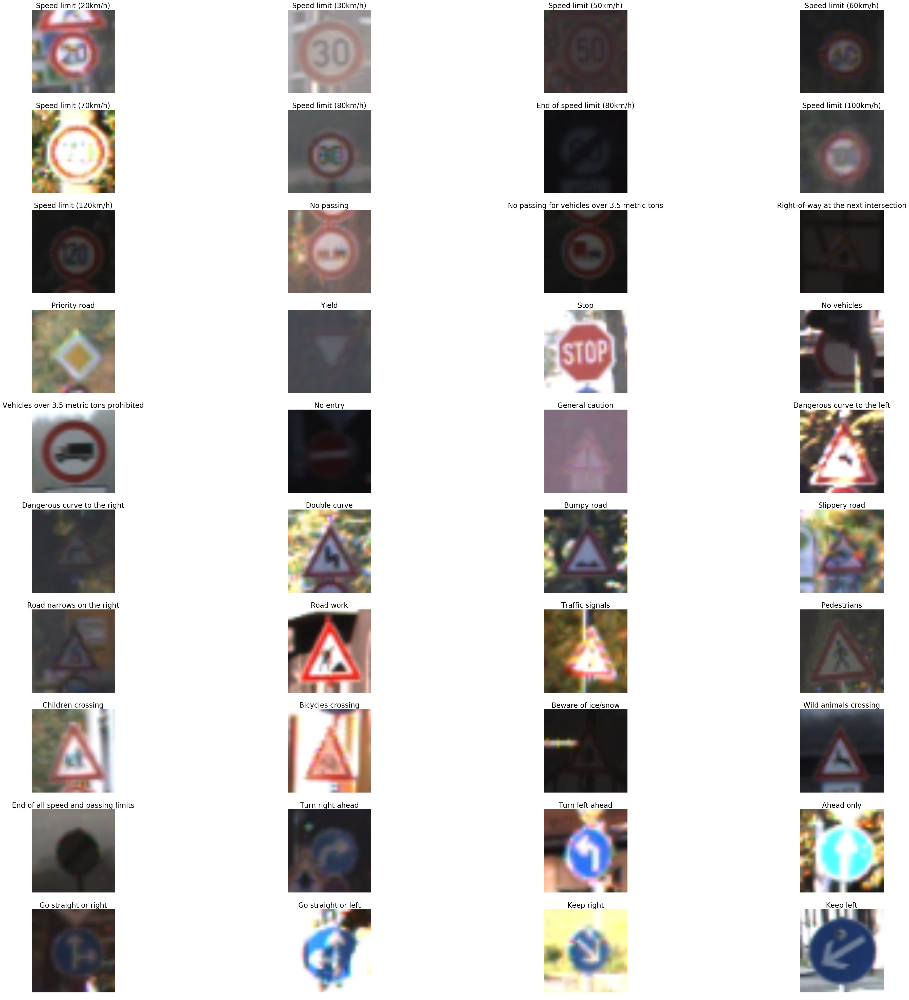

In [5]:
### Data exploration visualization goes here.
### Feel free to use as many code cells as needed.
import matplotlib.pyplot as plt
from matplotlib.figure import Figure
# Visualizations will be shown in the notebook.
%matplotlib inline

def get_images_to_plot(images, labels):
    selected_image = []
    idx = []
    for i in range(n_classes):
        selected = np.where(labels == i)[0][0]
        selected_image.append(images[selected])
        idx.append(selected)
    return selected_image,idx
            
def plot_images(selected_image,row=5,col=10,idx = None):     
    count =0;
    f, axarr = plt.subplots(row, col,figsize=(50, 50))
   
    for i in range(row): 
         for j in range(col):
                if(count < len(selected_image)):
                    axarr[i,j].imshow(selected_image[count])
                    if(idx != None):
                        axarr[i,j].set_title(traffic_labels_dict[y_train[idx[count]]], fontsize=20)
                axarr[i,j].axis('off')
                count = count + 1
           
            

selected_image,idx = get_images_to_plot(X_train,y_train)
plot_images(selected_image,row=10,col=4,idx=idx)

In [6]:
import tensorflow as tf
import numpy as np
from sklearn.metrics import confusion_matrix
import time
from datetime import timedelta
import math
import os
import prettytensor as pt
from scipy import misc
import cv2

In [7]:
def one_hot_encoded(class_numbers, num_classes=None):
    """
    Generate the One-Hot encoded class-labels from an array of integers.
    For example, if class_number=2 and num_classes=4 then
    the one-hot encoded label is the float array: [0. 0. 1. 0.]
    :param class_numbers:
        Array of integers with class-numbers.
        Assume the integers are from zero to num_classes-1 inclusive.
    :param num_classes:
        Number of classes. If None then use max(cls)-1.
    :return:
        2-dim array of shape: [len(cls), num_classes]
    """

    # Find the number of classes if None is provided.
    if num_classes is None:
        num_classes = np.max(class_numbers) - 1

    return np.eye(num_classes, dtype=float)[class_numbers]

In [8]:
X_train_extra = X_train
Y_train_extra = y_train
def get_additional(count,label,X_train,y_train):
    selected = np.where(y_train == label)[0]
    counter = 0;
    m = 0;
    # just select the first element in selected labels
    X_mqp = X_train[selected[0]]
    X_mqp = X_mqp[np.newaxis,...]
    while m < (len(selected)):
        #ignore the first element, since it already selected
        aa = X_train[selected[m]]   
        X_mqp = np.vstack([X_mqp,aa[np.newaxis,...]])
        if(counter >= count):
            break
        if(m == (len(selected)-1)):
            m = 0
        counter = counter + 1
        m = m + 1
    Y_mqp=np.full((len(X_mqp)), label, dtype='uint8')
    
    return X_mqp,Y_mqp
   
def balance_dataset(X_train_extra,Y_train_extra):
    hist = np.bincount(y_train)
    max_count = np.max(hist)
    for i in range(len(hist)):
        X_mqp,Y_mqp = get_additional(max_count-hist[i],i,X_train,y_train)
        X_train_extra = np.vstack([X_train_extra,X_mqp]) 
        Y_train_extra = np.append(Y_train_extra,Y_mqp)
    return X_train_extra,Y_train_extra

X_train_extra,Y_train_extra = balance_dataset(X_train_extra,Y_train_extra)
print(Y_train_extra.shape)
print(X_train_extra.shape)
print(np.bincount(Y_train_extra))
print(np.bincount(y_train))

(96836,)
(96836, 32, 32, 3)
[2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252
 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252
 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252 2252]
[ 210 2220 2250 1410 1980 1860  420 1440 1410 1470 2010 1320 2100 2160  780
  630  420 1110 1200  210  360  330  390  510  270 1500  600  240  540  270
  450  780  240  689  420 1200  390  210 2070  300  360  240  240]


In [9]:
Y_train_hot = one_hot_encoded(Y_train_extra,num_classes)
Y_test_hot = one_hot_encoded(y_test,num_classes)

In [10]:
from sklearn.model_selection import train_test_split
X_train_set,X_validation,Y_train_set,Y_validation = train_test_split( X_train_extra, Y_train_hot, test_size=0.02, random_state=42)
print(X_validation.shape)


(1937, 32, 32, 3)


----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [11]:


#output placeholder
y_true = tf.placeholder(tf.float32, shape=[None, num_classes], name='y_true')

#input place holder
x = tf.placeholder(tf.float32, shape=[None, img_size, img_size, num_channels], name='x')

#actual class

y_true_cls = tf.argmax(y_true, dimension=1)
#y train

    
### Feel free to use as many code cells as needed.


In [12]:
def pre_process_image(image, training):
    # This function takes a single image as input,
    # and a boolean whether to build the training or testing graph.
    
    if training:
        # For training, add the following to the TensorFlow graph.

        # Randomly crop the input image.
        image = tf.image.per_image_standardization(image)
        
        # Randomly flip the image horizontally.
        image = tf.image.random_flip_left_right(image)
        
        # Randomly adjust hue, contrast and saturation.
        image = tf.image.random_hue(image, max_delta=0.05)
        image = tf.image.random_contrast(image, lower=0.3, upper=1.0)
        image = tf.image.random_brightness(image, max_delta=0.2)
        image = tf.image.random_saturation(image, lower=0.0, upper=2.0)

        # Some of these functions may overflow and result in pixel
        # values beyond the [0, 1] range. It is unclear from the
        # documentation of TensorFlow 0.10.0rc0 whether this is
        # intended. A simple solution is to limit the range.

        # Limit the image pixels between [0, 1] in case of overflow.
        
    else:
        # For training, add the following to the TensorFlow graph.

        # Crop the input image around the centre so it is the same
        # size as images that are randomly cropped during training.
        image = tf.image.per_image_standardization(image)
    return image

def pre_process(images, training):
    # Use TensorFlow to loop over all the input images and call
    # the function above which takes a single image as input.
    images = tf.map_fn(lambda image: pre_process_image(image, training), images)

    return images



In [13]:
distorted_images = pre_process(images=x, training=True)

In [14]:
def main_network(images, training):
    # Wrap the input images as a Pretty Tensor object.
    x_pretty = pt.wrap(images)

    # Pretty Tensor uses special numbers to distinguish between
    # the training and testing phases.
    if training:
        phase = pt.Phase.train
    else:
        phase = pt.Phase.infer

    # Create the convolutional neural network using Pretty Tensor.
    # It is very similar to the previous tutorials, except
    # the use of so-called batch-normalization in the first layer.
    with pt.defaults_scope(activation_fn=tf.nn.relu, phase=phase):
        y_pred, loss = x_pretty.\
            conv2d(kernel=5, depth=64, name='layer_conv1', batch_normalize=True).\
            max_pool(kernel=2, stride=2).\
            conv2d(kernel=5, depth=64, name='layer_conv2').\
            max_pool(kernel=2, stride=2).\
            flatten().\
            fully_connected(size=256, name='layer_fc1').\
            fully_connected(size=128, name='layer_fc2').\
            softmax_classifier(num_classes=num_classes, labels=y_true)

    return y_pred, loss

In [15]:
def create_network(training):
    # Wrap the neural network in the scope named 'network'.
    # Create new variables during training, and re-use during testing.
    with tf.variable_scope('network', reuse=not training):
        # Just rename the input placeholder variable for convenience.
        images = x

        # Create TensorFlow graph for pre-processing.
        images = pre_process(images=images, training=training)

        # Create TensorFlow graph for the main processing.
        y_pred, loss = main_network(images=images, training=training)

    return y_pred, loss



In [16]:
global_step = tf.Variable(initial_value=0,
                          name='global_step', trainable=False)

In [17]:
_, loss = create_network(training=True)

In [18]:
optimizer = tf.train.AdamOptimizer(learning_rate=1e-4).minimize(loss, global_step=global_step)

In [19]:
y_pred, _ = create_network(training=False)

In [20]:
soft_max_5 = tf.nn.top_k(y_pred,k=5) 

In [21]:
y_pred_cls = tf.argmax(y_pred, dimension=1)

In [22]:
correct_prediction = tf.equal(y_pred_cls, y_true_cls)

In [23]:
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

In [24]:
saver = tf.train.Saver()

In [25]:
def get_weights_variable(layer_name):
    # Retrieve an existing variable named 'weights' in the scope
    # with the given layer_name.
    # This is awkward because the TensorFlow function was
    # really intended for another purpose.

    with tf.variable_scope("network/" + layer_name, reuse=True):
        variable = tf.get_variable('weights')

    return variable

In [26]:
weights_conv1 = get_weights_variable(layer_name='layer_conv1')
weights_conv2 = get_weights_variable(layer_name='layer_conv2')

In [27]:
def get_layer_output(layer_name):
    # The name of the last operation of the convolutional layer.
    # This assumes you are using Relu as the activation-function.
    tensor_name = "network/" + layer_name + "/Relu:0"

    # Get the tensor with this name.
    tensor = tf.get_default_graph().get_tensor_by_name(tensor_name)

    return tensor

In [28]:
session = tf.Session()

In [29]:
save_dir = 'checkpoints/'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [30]:
save_path = os.path.join(save_dir, 'traffic-sign')

In [31]:
try:
    print("Trying to restore last checkpoint ...")

    # Use TensorFlow to find the latest checkpoint - if any.
    last_chk_path = tf.train.latest_checkpoint(checkpoint_dir=save_dir)

    # Try and load the data in the checkpoint.
    saver.restore(session, save_path=last_chk_path)

    # If we get to this point, the checkpoint was successfully loaded.
    print("Restored checkpoint from:", last_chk_path)
except:
    # If the above failed for some reason, simply
    # initialize all the variables for the TensorFlow graph.
    print("Failed to restore checkpoint. Initializing variables instead.")
    session.run(tf.global_variables_initializer())

Trying to restore last checkpoint ...
Restored checkpoint from: checkpoints/traffic-sign-10000


In [32]:
train_batch_size = 64

In [33]:
def random_batch(images_train,labels_train):
    # Number of images in the training-set.
    num_images = len(images_train)

    # Create a random index.
    idx = np.random.choice(num_images,
                           size=train_batch_size,
                           replace=False)

    # Use the random index to select random images and labels.
    x_batch = images_train[idx, :, :, :]
    y_batch = labels_train[idx,:]
  
    return x_batch, y_batch

In [34]:
def optimize(num_iterations):
    # Start-time used for printing time-usage below.
    start_time = time.time()
    feed_dict_validation = {x: X_validation,
                           y_true: Y_validation}


    for i in range(num_iterations):
        # Get a batch of training examples.
        # x_batch now holds a batch of images and
        # y_true_batch are the true labels for those images.
        x_batch, y_true_batch = random_batch(X_train_set,Y_train_set)
        #,
        # Put the batch into a dict with the proper names
        # for placeholder variables in the TensorFlow graph.
        feed_dict_train = {x: x_batch,
                           y_true: y_true_batch}
        

        # Run the optimizer using this batch of training data.
        # TensorFlow assigns the variables in feed_dict_train
        # to the placeholder variables and then runs the optimizer.
        # We also want to retrieve the global_step counter.
        i_global, _ = session.run([global_step, optimizer],
                                  feed_dict=feed_dict_train)

        # Print status to screen every 100 iterations (and last).
        if (i_global % 100 == 0) or (i == num_iterations - 1):
            # Calculate the accuracy on the training-batch.
            batch_acc = session.run(accuracy,
                                    feed_dict=feed_dict_train)
            validation_acc = session.run(accuracy,
                                   feed_dict=feed_dict_validation)
            # Print status.
            msg = "Global Step: {0:>6}, Training Batch Accuracy: {1:>6.1%},Valdation Batch Accuracy: {2:>6.1%}"
            print(msg.format(i_global, batch_acc,validation_acc))

        # Save a checkpoint to disk every 1000 iterations (and last).
        if (i_global % 1000 == 0) or (i == num_iterations - 1):
            # Save all variables of the TensorFlow graph to a
            # checkpoint. Append the global_step counter
            # to the filename so we save the last several checkpoints.
            saver.save(session,
                       save_path=save_path,
                       global_step=global_step)

            print("Saved checkpoint.")

    # Ending time.
    end_time = time.time()

    # Difference between start and end-times.
    time_dif = end_time - start_time

    # Print the time-usage.
    print("Time usage: " + str(timedelta(seconds=int(round(time_dif)))))

In [37]:
optimize(10)

Global Step:  10233, Training Batch Accuracy:  98.4%,Valdation Batch Accuracy:  98.9%
Saved checkpoint.
Time usage: 0:00:02


In [38]:
def ordered_batch(images_train,labels_train,start=0,end=64):
    # Number of images in the training-set.
    num_images = len(images_train)

    # Create a random index.

    # Use the random index to select random images and labels.
    x_batch = images_train[start:end, :, :, :]
    y_batch = labels_train[start:end,:]
  
    return x_batch, y_batch

In [39]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.\
def caluclate_average_accuracy(random_test_iteration = 50):
    
    test_accuracy = 0
    for i in range(random_test_iteration):
        # Get a batch of training examplerandom_test_iteration = 50s.
        # x_batch now holds a batch of images and
        # y_true_batch are the true labels for those images.
        x_batch, y_true_batch = random_batch(X_test,Y_test_hot)
        feed_dict_test = {x: x_batch,
                           y_true: y_true_batch}
        test_accuracy = test_accuracy + session.run(accuracy,
                                   feed_dict=feed_dict_test)
    return  test_accuracy/random_test_iteration   
msg = "Test accuracy {0:>6.1%}"
print(msg.format(caluclate_average_accuracy()))

Test accuracy  89.2%


### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:**

I standarised all the images first. ie I made the images to have zero mean and unit variance. I did this make sure that weight are evenly distributed during training. I also one hot encoded the output label. I standarised the image because the optimiser can optimise easily since the gradient does not jump.

### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:**

I took 3 percent of total training data and converted it into validation, remaining I kept as train data. 
I  noticed the training set is not balanced, so I generated additional data to balance the training set. This will prevent nerual to prefer one label than another.
Also I generated additional data by randoming flipping, adjusting hue, adjusting saturation the image of training data. This will give variation to data and prevent over fitting.


### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**

I adapted alex net as the model arhitecture of my DNN.  There are seven layers in my neural network. Each layer has a relu activation unit.
The image of 32 X 32 X 3, is passed on to first convolution layer with filter size 5 X 5 and depth 64, stride 1, padding 'SAME'. It is followed by a max pooling layer of size 2 and stride 2. This is followed by convolution layer with filter size 5 X 5 and depth 64, stride 1 , padding 'SAME'. It is followed by a max pooling layer of size 2 and stride 2 and then a fully connected layer of size 256. This layer is again followed by fully connected layer of size 128, followed by a softmax function. below is my DNN architecture

conv2d(kernel=5, depth=64, name='layer_conv1', batch_normalize=True). \<br/>
            max_pool(kernel=2, stride=2).\ <br/>
            conv2d(kernel=5, depth=64, name='layer_conv2').\ <br/>
            max_pool(kernel=2, stride=2).\ <br/>
            flatten().\ <br/>
            fully_connected(size=256, name='layer_fc1').\ <br/>
            fully_connected(size=128, name='layer_fc2').\ <br/>
            softmax_classifier(num_classes=num_classes, labels=y_true) <br/>

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)


**Answer:** optimizer = AdamOptimizer,
batch size = 64,
epochs = 10,0000,
learning_rate=1e-4.

I used batch size of 64 since it will fit in memory easily. Batch size of 1024 crashed the program. I trained only for 10,000 epoch. I noticed that my training accuracy is around 96 % when I train for 10,000 epoch. 
I choose learning rate of 1e-4 because the training accuracy gradually increased and rarely dropped back. Choosing a higher learning rate can increase my speed of training, but I didnt try. 

### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:** Deep learning was tough, so I tried to read different tutorial online to better understand the scope0. 
Initially I started with LeNet, and converted all the color images to grayscale. It didnt perform well. The accuracy of prediction were around 60 %. Then I choose CIFAR 10 architecture which uses color images.

I tried out example tutorial of CIFAR 10 data set. I thought the same architecture is good enough for classifying traffic signals since both have similar charateristics. CIFAR 10 classification used similar color images.  The architecture was small enough to be trained reasonally fast in my computer and experiment with different setting on learning rate. If faster computer was avaialable  I would have choosen architecture which is deeper.

I believe fine-tuning alexnet will give better result than this architecture


---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

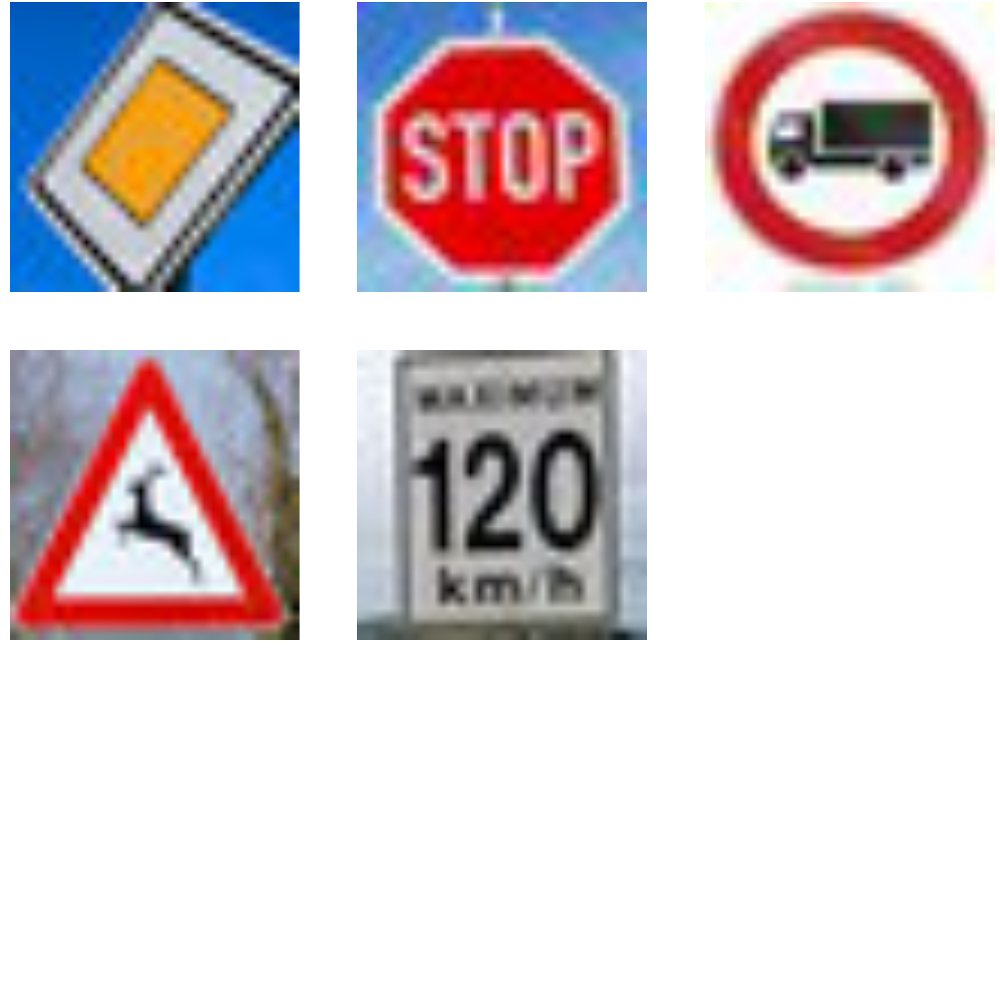

In [40]:
def read_dir_images(dirName="data"):
    X_dir = []
    Y_dir = []
    for name in os.listdir(dirName):
        X_dir.append(cv2.cvtColor(cv2.imread(dirName+"/"+name), cv2.COLOR_BGR2RGB))
        Y_dir.append(int(name.split(".")[0]))
    return np.array(X_dir),np.array(Y_dir),one_hot_encoded(np.array(Y_dir),num_classes)
X_dir,Y_dir,Y_dir_hot = read_dir_images()
plot_images(X_dir,row=3,col=3)

In [41]:
def predict_given_image(X_dir,Y_dir):
    feed_dict_test = {x: X_dir,
                           y_true: Y_dir_hot}
    predicted_class = session.run(y_pred_cls,feed_dict=feed_dict_test)
    return predicted_class

predictions = predict_given_image(X_dir,Y_dir)

print(Y_dir)
print(predictions)

for i in range(len(X_dir)):
    print(traffic_labels_dict[Y_dir[i]] + "  -------- " + traffic_labels_dict[predictions[i]])
    

[12 14 16 31  8]
[12 14 16 21  0]
Priority road  -------- Priority road
Stop  -------- Stop
Vehicles over 3.5 metric tons prohibited  -------- Vehicles over 3.5 metric tons prohibited
Wild animals crossing  -------- Double curve
Speed limit (120km/h)  -------- Speed limit (20km/h)


### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



**Answer:** '120 Km/h' was difficult to classify. This is because the training image of '120 Km/h' is different than the image from the internet. I believe different variety of '120 Km/h' should be added to the data set.

Below you can see images from test set. Here most of misclassification occurs in the reading the number in speed limit. The neural network is able to classify traffic sign as speed limit symbol but not actual value. I believe passing the traffic sign into another neural network that recognises the number will improve accuracy.

Speed limit (60km/h)  -------- Speed limit (80km/h)
Road narrows on the right  -------- Pedestrians
Road work  -------- Traffic signals
Children crossing  -------- Right-of-way at the next intersection
Beware of ice/snow  -------- Pedestrians
Speed limit (100km/h)  -------- Speed limit (70km/h)
End of all speed and passing limits  -------- Speed limit (30km/h)


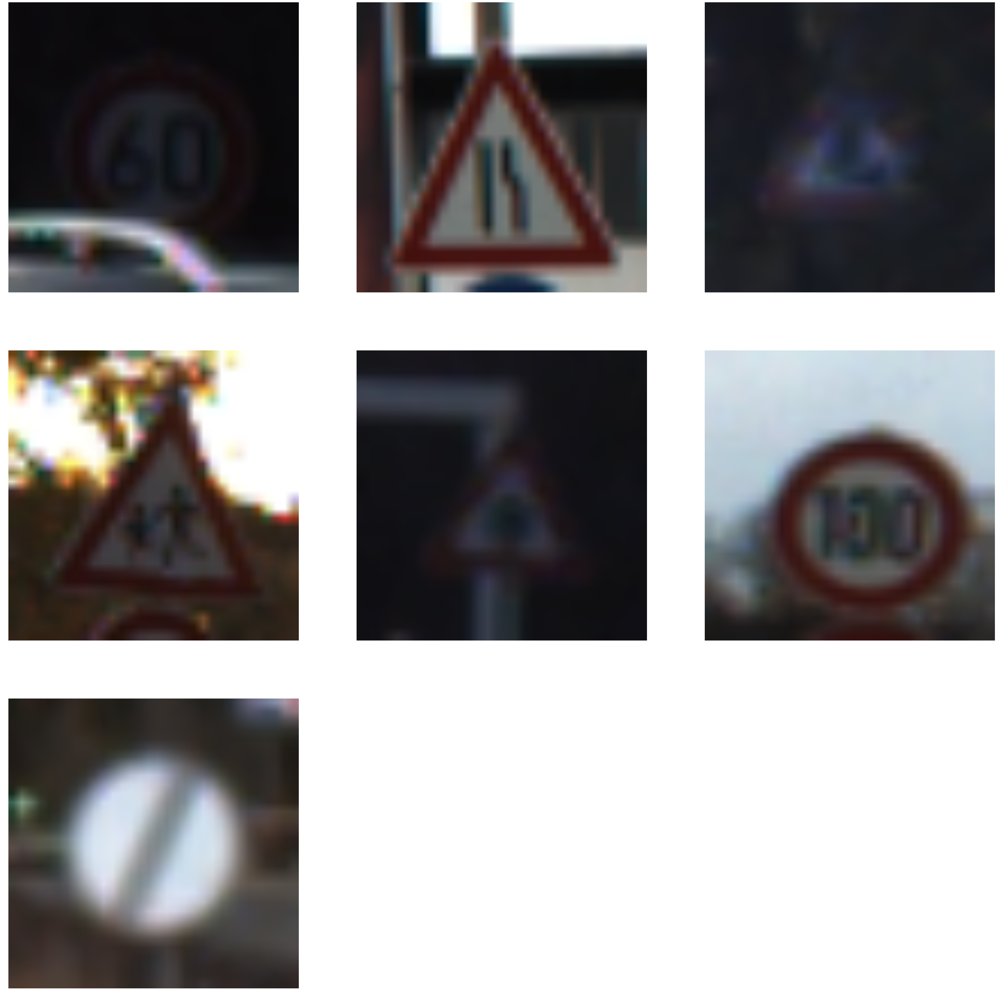

In [42]:
### Run the predictions here.
def caluclate_miss_classification_index(start=0,end=100):
    
    test_accuracy = 0
        # Get a batch of training examplerandom_test_iteration = 50s.
        # x_batch now holds a batch of images and
        # y_true_batch are the true labels for those images.
    start = 0
    end = 100
    x_batch, y_true_batch = ordered_batch(X_test,Y_test_hot,start,end)
    feed_dict_test = {x: x_batch,
                           y_true: y_true_batch}
    predicted_class = session.run(y_pred_cls,feed_dict=feed_dict_test)
    predict = session.run(correct_prediction,
                                   feed_dict=feed_dict_test)
    idx = np.where(predict ==False)
    return  idx,predicted_class[idx]
idx,predicted_class = caluclate_miss_classification_index()
wrong_images = X_test[idx]
plot_images(wrong_images,row=3,col=3)
traffic_labels_dict
for i in range(len(idx[0])):
    print(traffic_labels_dict[y_test[idx[0][i]]] + "  -------- " + traffic_labels_dict[predicted_class[i]])

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


**Answer:** Out of 5 images I downloaded from internet 4 were classified correctly. 1 was misclassifed (120 Km/hr). So it is 80 % accurate. The average accuracy on test set was 89.4 %. I believe my model performs quite well on images from internet. More images from internet should be used to verify the accuracy

TopKV2(values=array([[  1.00000000e+00,   3.61463983e-15,   2.65026054e-17,
          1.56581303e-17,   1.33286786e-18],
       [  1.00000000e+00,   1.03403028e-12,   7.27444018e-16,
          9.81083252e-19,   8.49325685e-19],
       [  9.98118043e-01,   1.73411006e-03,   8.92908502e-05,
          5.77350183e-05,   8.59652971e-07],
       [  7.28197515e-01,   2.71802515e-01,   8.81648747e-12,
          1.61778533e-14,   1.67015775e-15],
       [  9.99994278e-01,   5.18264687e-06,   5.44775730e-07,
          2.51193200e-09,   3.56068008e-10]], dtype=float32), indices=array([[12, 14, 25, 26, 13],
       [14,  4,  1, 18,  7],
       [16, 42,  7,  5, 41],
       [21, 31, 19, 27, 11],
       [ 0,  8, 31, 18,  1]]))


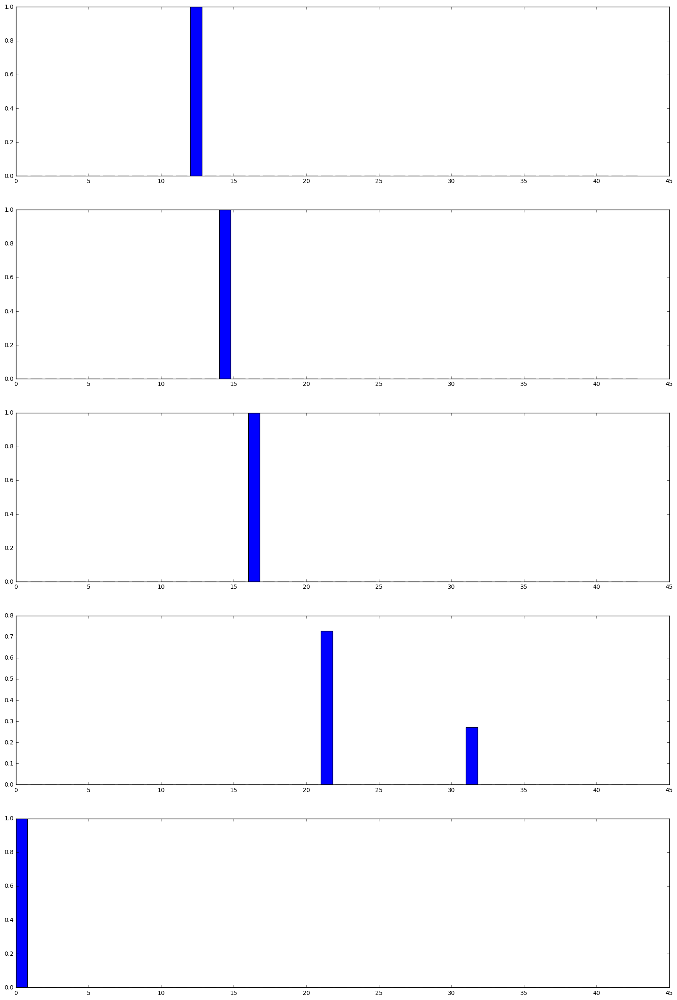

In [68]:
### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.
def find_top_k():
    feed_dict_test = {x: X_dir,
                           y_true: Y_dir_hot}
    softmax_all = session.run(soft_max_5,feed_dict=feed_dict_test)
    return softmax_all
predicted_class = find_top_k()    
print(predicted_class)

def plot_top_k(predicted_class):
    fig, axes= plt.subplots(nrows=5,figsize=(20, 30))
    for i in range(len(predicted_class[1])):
        counter = 0
       
        all_classes = np.zeros(num_classes)
        for m in predicted_class[1][i]:
            all_classes[m] = predicted_class[0][i][counter]
            counter = counter + 1
        y_pos = np.arange(len(all_classes))
        axes[i].bar(y_pos,all_classes)
        
plot_top_k(predicted_class)



### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

**Answer:** Out of 5 images I downloaded from the internet, four were classified correctly. one was misclassified (120 km/h speed limit), though 120 km/h speed limit was in the top_5. My model is 100% accurate in top-5 predicition for the given images from internet. More evaluations needs to be performed. I have visualised softmax probability for the one misclassified example.
The fourth plot shows the softmax probaiblities distributed over two labels namely 21 and 31. The label 31 is the right classification.

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.